# Visualizar lo aprendido por las convets

- Visualizar salidas intermedias
- Visualizar filtros de convets
- Visualizar mapas de calor de activación de clases en una imagen

## Visualizar salidas intermedias

Consiste en mostrar los mapas de características que son generados como salida por varias capas de convolución y _pooling_ de una red, al dar una entrada intermedia.

Los mapas de características son en tres dimensiones: anchura, altura y profundidad (canales). Por lo que, se muestra el contenido de cada canal de forma independiente para visualizar una imagen en 2D.

In [1]:
import tensorflow as tf

model = tf.keras.models.load_model('models/cats_and_dogs_small_2.keras')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 72, 72, 128)       36992     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 36, 36, 128)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 34, 34, 128)       147584    
_________________________________________________________________
flatten_2 (Flatten)          (None, 147968)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 147968)           

In [15]:
# Preprocesar una sola imagen

img_path = '/tf/deep_learning_keras/data/cats_and_dogs/origin_dir/test/1700.jpg'

from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

img = load_img(img_path, target_size=(150, 150))
img_tensor = img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


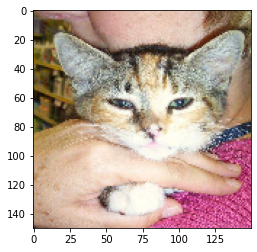

In [16]:
# Mostrar la imagen

import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

Para extraer los mapas de características se crea un modelo de Keras que toma lotes de imágenes como entrada y genera como salida las activaciones de todas las capas de convolución y de _pooling_.

El modelo se crea una instancia utilanzo dos argumentos: tensor de entrada (o lista de tensores de entrada) y un tensor de salida (o lista de tensores de salida)

In [23]:
# Crear instancia en un modelo a partir de un tensor de entrada y una lista de tensores de salida

layer_outputs = [layer.output for layer in model.layers[:8]] # Extraer la salida de las 8 capas superiores
activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

Cuando se inicia una entrada de imagen, este modelo devuelve los valores de las activaciones de capas del modelo original.

In [25]:
# Ejecutar el modelo en modo predicción

activations = activation_model.predict(img_tensor)

# Esta es la primera capa convolucional para la entrada de la imagen del gato
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


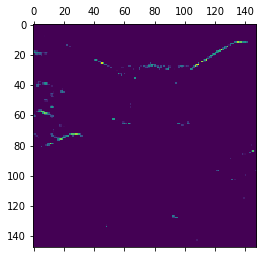

In [27]:
# Visualizar el cuarto canal

import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

Este canal parece codificar un detector de bordes diagonales

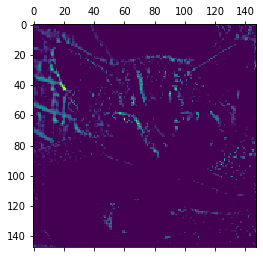

In [28]:
# Visualizar el séptimo canal

plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')

MemoryError: Unable to allocate 23.0 PiB for an array with shape (1368408064, 2367488) and data type float64

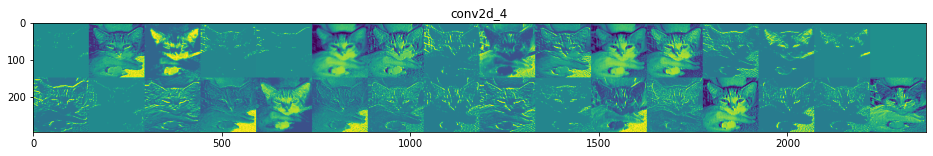

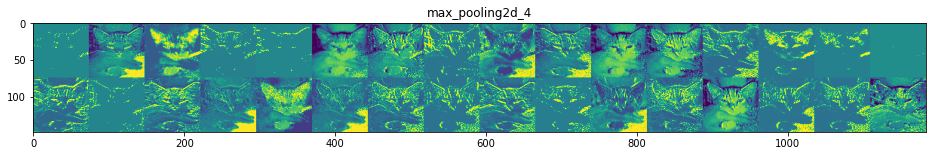

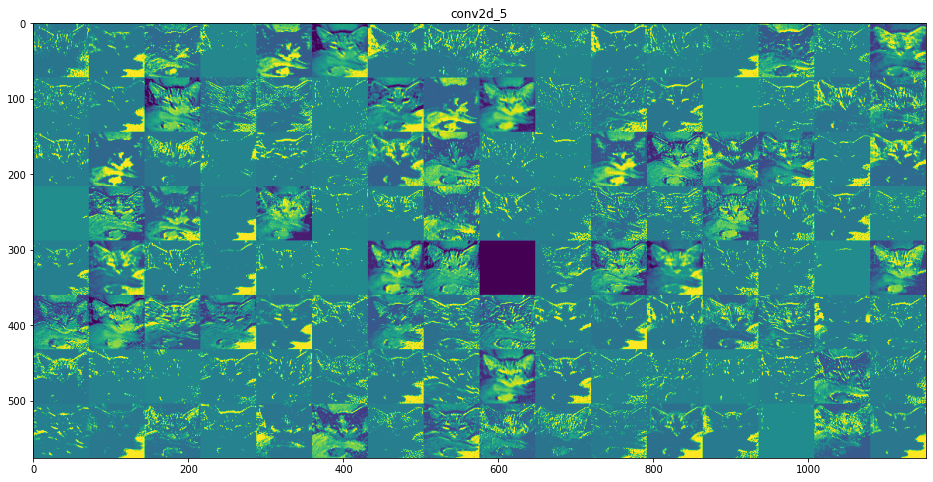

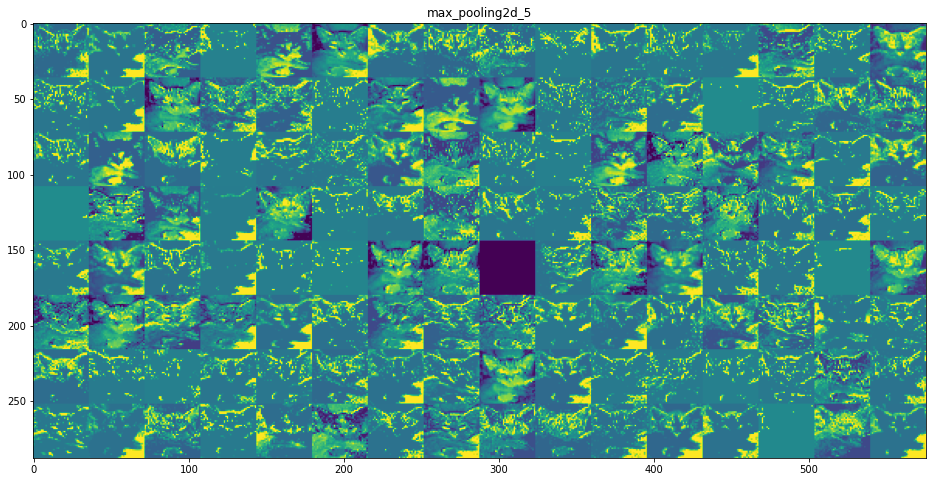

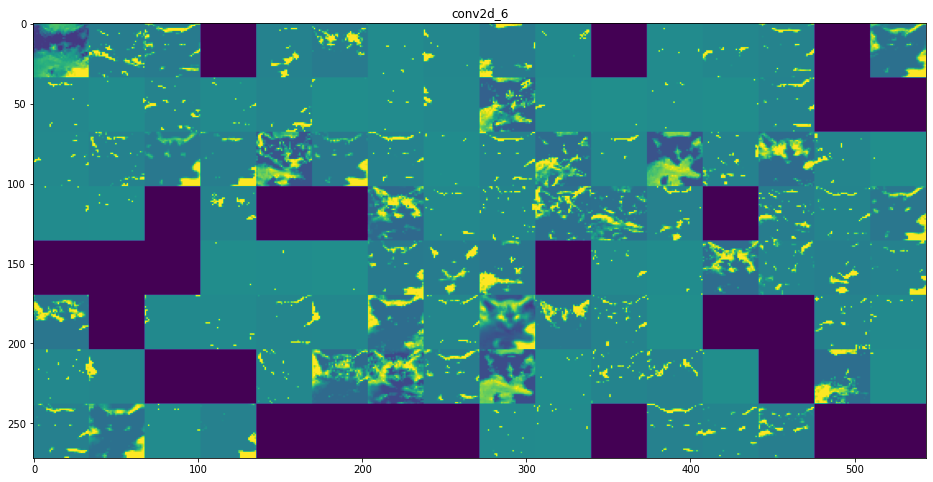

In [33]:
# Visualizar todos los canales en cada activación intermedia

layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    
    size = layer_activation.shape[1]
    
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image
            
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

# Visualizar filtros de convets

In [6]:
# Definición de tensor de pérdida para visualizar el filtro

from keras.applications import VGG16
from keras import backend as K

model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [7]:
# Obtener el gradiente de la pérdida respecto a la entrada

grads = K.gradients(loss, model.input)[0]

In [9]:
# Normalización del grado del gradiente

grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [10]:
# Búsequeda de los valores de salida Numpy dado los valores de entrada Numpy

iterate = K.function([model.input], [loss, grads])

import numpy as np

loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [13]:
# Mazimización de la pérdida mediante descenso de gradiente estocástico

input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128

step = 1
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [14]:
# Función de utilidad para convertir un tensor en una imagen válida

def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    x += 0.5
    x = np.clip(x, 0, 1)
    
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [15]:
# Función para generar visualizaciones de filtros

def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    
    grads = K.gradients(loss, model.input)[0]
    
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    
    iterate = K.function([model.input], [loss, grads])
    
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128
    
    step = 1
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    
    img = input_img_data[0]
    return deprocess_image(img)

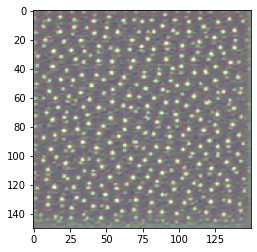

In [17]:
import matplotlib.pyplot as plt

plt.imshow(generate_pattern('block3_conv1', 0))

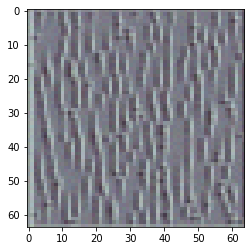

In [21]:
plt.imshow(generate_pattern(layer_name, i + (j * 8), size=size))

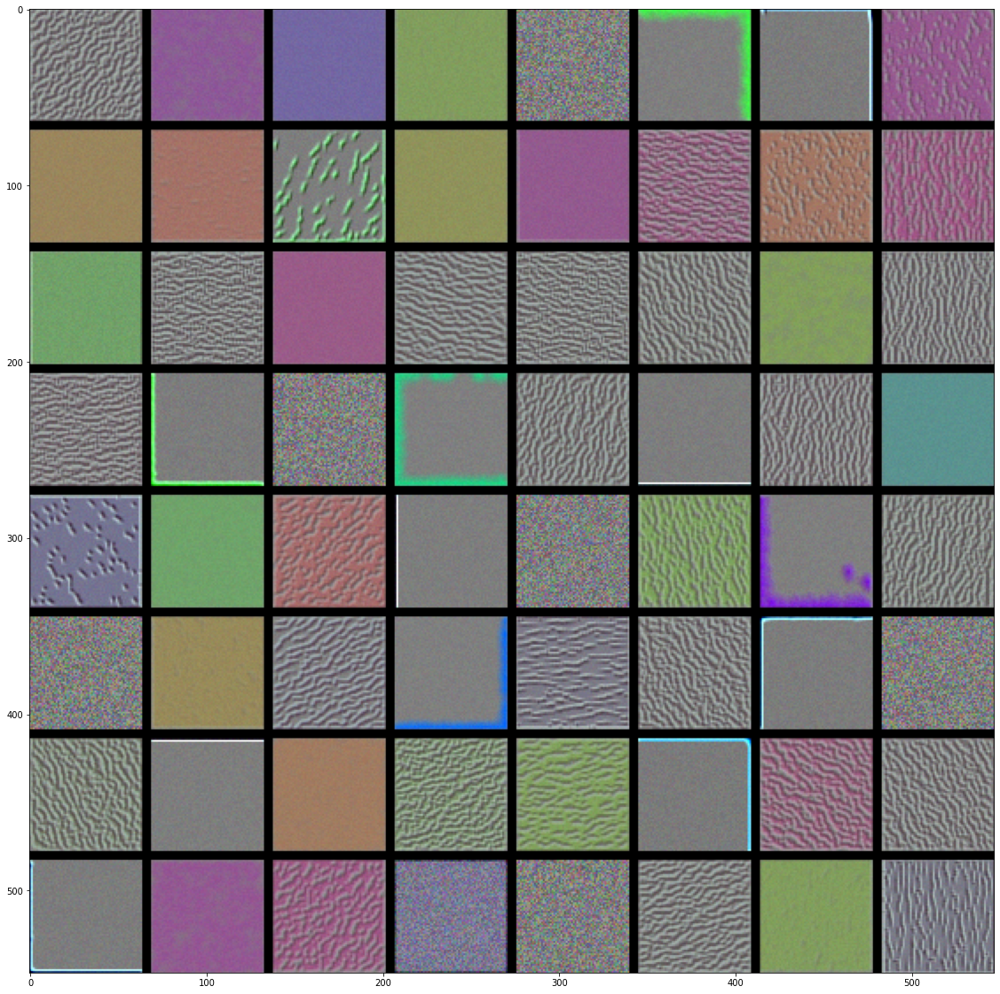

In [23]:
# Generar una cuadrícula de todos los patrones de respuesta de los filtros en una capa

layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
        
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, 
                vertical_start: vertical_end, :] = filter_img
        
plt.figure(figsize=(20, 20))
plt.imshow(results.astype(np.uint8))

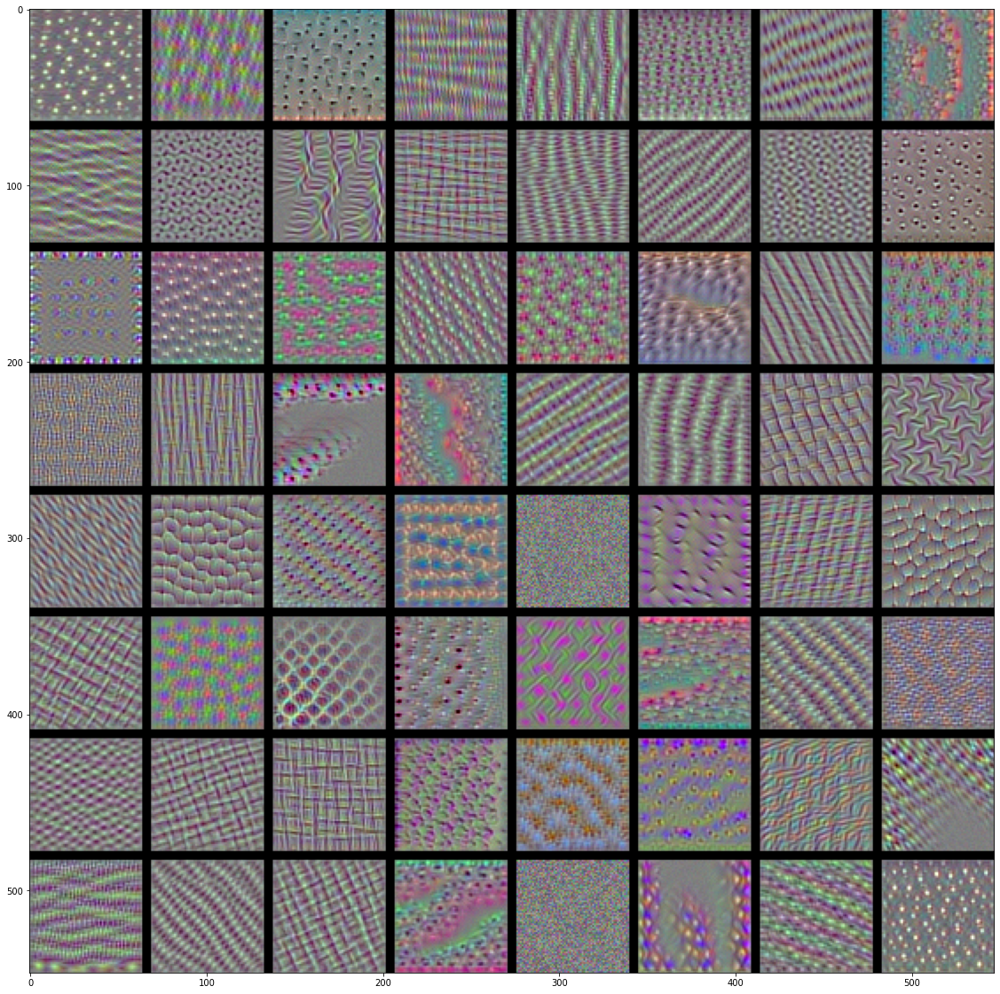

In [24]:
layer_name = 'block3_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
        
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, 
                vertical_start: vertical_end, :] = filter_img
        
plt.figure(figsize=(20, 20))
plt.imshow(results.astype(np.uint8))

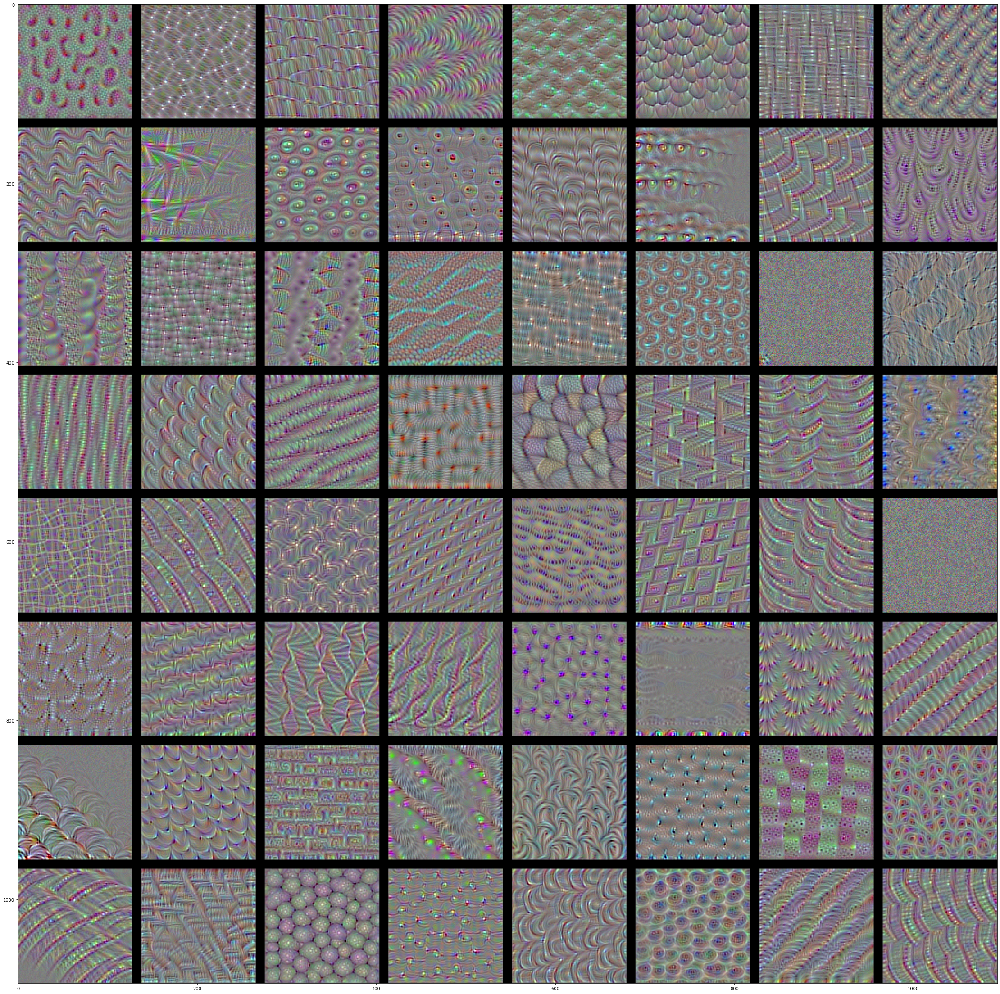

In [27]:
layer_name = 'block4_conv1'
size = 128 #64
margin = 10 #5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
        
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, 
                vertical_start: vertical_end, :] = filter_img
        
plt.figure(figsize=(40, 40))
plt.imshow(results.astype(np.uint8))

# Visualizar mapas de calor de activación de clase

Técnica útil para entender qué partes de la imagen llevan a una convet a tomar su decisión de clasificación final. Esto resulta de gran ayuda para depurar el proceso de decisión de una convet, sobre todo en el caso de un error de clasificación.

También, nos permite localizar objetos especificos de una imagen.

La técnica se llama "Visualización de Mapeo de Activación de Clases" (CAM, Class Activation Map), consiste en producir mapas de calor de activación de clase sobre una imagen de entrada. 

Un mapa de calor de activación de clase es una cuadricula 2D de cualquier imagen de entrada, indicando cómo es importante cada ubicación con respecto a la clase que se esta considerando.

Por ejemplo, si se introduce una imagen en la convet de clasificador de perros y gatos, la visualización de la CAM nos permite generar un mapa de calor para la clase "gato", indicando que tan gatunas son las diferentes partes de la imagen y, también un mapa de calor para la clase "perro", indicando cómo de perrunas son las partes de la imagen.

In [28]:
# Cargar la red VGG16 con peso preentrenado

from keras.applications.vgg16 import VGG16

model = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 40s 0us/step


In [30]:
# Preprocesar una imagen de entrada para VGG16

from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = '/tf/deep_learning_keras/data/cats_and_dogs/elephants.jpg'

img = image.load_img(img_path, target_size=(224, 224))

x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [31]:
preds = model.predict(x)
print('Predicted: ', decode_predictions(preds, top=3)[0])

40960/35363 [==================================] - 0s 1us/step
Predicted:  [('n02504458', 'African_elephant', 0.88319594), ('n01871265', 'tusker', 0.10102216), ('n02408429', 'water_buffalo', 0.008600003)]


In [33]:
# Configurar el algoritmo Grad-CAM

african_elephant_output = model.output[:, 386]
last_conv_layer = model.get_layer('block5_conv3')
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input],
                     [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)

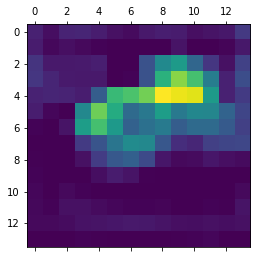

In [35]:
# Postprocesamiento del mapa de calor

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [36]:
# Superponer el mapa de calor sobre la imagen original

import cv2

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
cv2.imwrite('/tf/deep_learning_keras/data/cats_and_dogs/elephants_cam.jpg', superimposed_img)

True